In [12]:
# Importacion.
# import librosa
from scipy.io import wavfile
import IPython
import os
import numpy as np
import matplotlib.pyplot as plt

In [13]:
# Directorios que usaremos.
#Pondremos las direcciones de los resultados y de origen
cwd = os.getcwd()
audio_input_path = os.path.join(cwd, os.path.join('examples', 'original_wav'))  # cambiar '_input' por 'examples'
audio_output_path = os.path.join(cwd, os.path.join('examples', 'out_put'))
print(f'Directorio con los audios de entrada: {audio_input_path}')
print(f'Directorio donde guardaremos los audios generados: {audio_output_path}\n')

Directorio con los audios de entrada: /home/jose/Escritorio/SistemaMultimedia/uex-audiopy/practica1/Ejercicio1Audio/examples/original_wav
Directorio donde guardaremos los audios generados: /home/jose/Escritorio/SistemaMultimedia/uex-audiopy/practica1/Ejercicio1Audio/examples/out_put



In [14]:
# Cargamos el archivo de audio.
filename = os.path.join(audio_input_path, 'viola_soundtrack.wav')
# audio_data, sample_rate = librosa.load(filename, sr=None, mono=False)
sample_rate, audio_data = wavfile.read(filename)


In [15]:
# Mostrar informacion (sonido estéreo).
#El shape mostará el tamaño y el numero de los canales del sonido. En este caso, 2 por ser estereo. Ya ahi se muestran los canales, al menos 5
print('Datos de audio (estereo):')
print(f'- Tamaño:     {audio_data.shape}')
print(f'- 1º canal:   {audio_data[:5, 0]}...')
print(f'- 2º canal:   {audio_data[:5, 1]}...')
#La frecuencia de muestreo se tomó con el wavfile
print(f'Frecuencia de muestreo (sample rate): {sample_rate/1000} kHz')
print(f'- Resolucion: {type(audio_data[0,0])}\n')


Datos de audio (estereo):
- Tamaño:     (1755000, 2)
- 1º canal:   [ 0  0 -1  1 -1]...
- 2º canal:   [ 0 -1  1  0 -2]...
Frecuencia de muestreo (sample rate): 44.1 kHz
- Resolucion: <class 'numpy.int16'>



In [16]:
IPython.display.Audio(audio_data.T, rate=sample_rate) # .T se pasa únicamente si es audio estéreo.

In [17]:
# Convertimos a mono mediante la media por canal (simplificacion).
#Se hace la media aritmetica de los canales para dar el mono, más adelante se muestra
new_data_mono = audio_data.mean(axis=1)  # Column-wise.
print('Nuevos datos de audio (mono):')
print(f'- Nuevo tamaño: {new_data_mono.shape}')
print(f'- Canal unico:  {new_data_mono[:5]}...')

# Mantenemos la misma resolucion que antes.
new_data_mono = new_data_mono.astype(np.int16)
print(f'- Resolucion:   {type(new_data_mono[0])}\n')

Nuevos datos de audio (mono):
- Nuevo tamaño: (1755000,)
- Canal unico:  [ 0.  -0.5  0.   0.5 -1.5]...
- Resolucion:   <class 'numpy.int16'>



In [18]:
IPython.display.Audio(new_data_mono, rate=sample_rate) # Se quita la opción T porque no es estereo

In [19]:
# Guardamos el archivo mono a un fichero de tipo wav.
wavfile.write(
    filename=os.path.join(audio_output_path, 'audio1.wav'),
    rate=sample_rate,
    data=new_data_mono
)

In [20]:
#Esto es para ver el peso en MB del original
!ls -sh examples/original_wav/viola_soundtrack.wav
#Esto es para ver el peso del mono
!ls -sh examples/out_put/audio1.wav

6,7M examples/original_wav/viola_soundtrack.wav
3,4M examples/out_put/audio1.wav


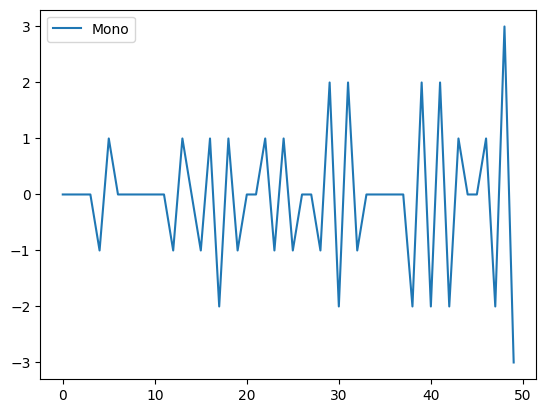

In [21]:
fig, ax = plt.subplots() 
end=50
 
ax.plot(new_data_mono[:end],label="Mono")  # Plot some data on the Axes.
ax.legend()
plt.show()   

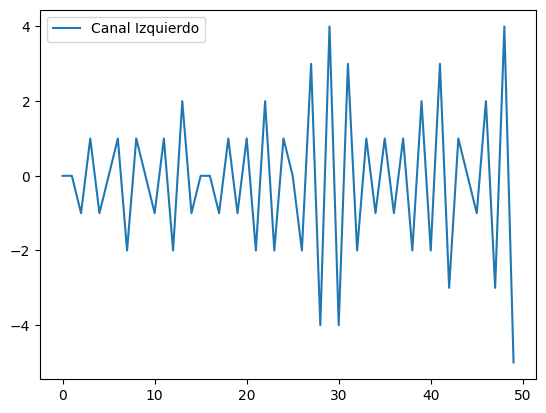

In [22]:
fig, ax = plt.subplots()             # Create a figure containing a single Axes.
ax.plot(audio_data[:end,0],label="Canal Izquierdo") 
ax.legend()
plt.show()                           # Show the figure.                         # Show the figure.

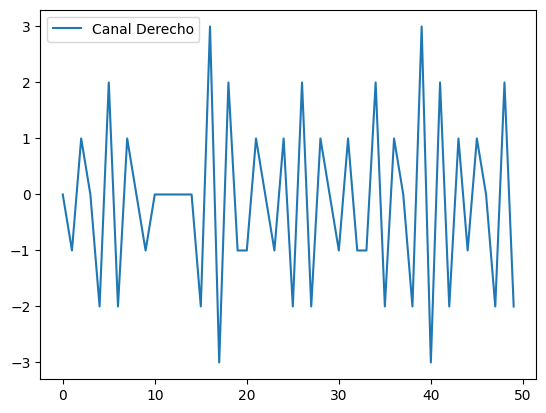

In [23]:
fig, ax = plt.subplots()             # Create a figure containing a single Axes. 
ax.plot(audio_data[:end,1], label= "Canal Derecho") 
ax.legend()
plt.show()                           # Show the figure.

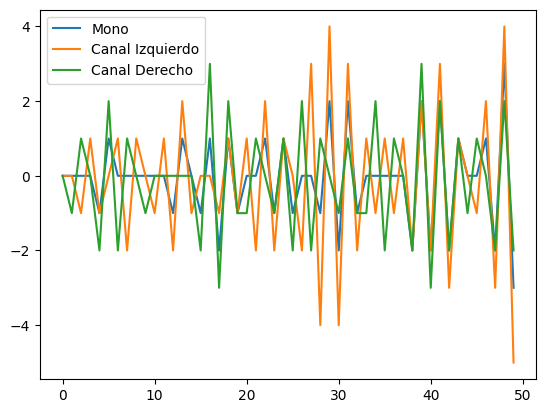

In [25]:
fig, ax = plt.subplots()             # Create a figure containing a single Axes.
ax.plot(new_data_mono[:end],label="Mono")  # Plot some data on the Axes.
ax.plot(audio_data[:end,0],label="Canal Izquierdo")
ax.plot(audio_data[:end,1], label= "Canal Derecho") 
ax.legend()
plt.show()  

### Diferencias entre mono y estereo



Las principales diferencias entre estos radica en la cantidad de canales que hay. El estereo utiliza dos canales para poder escucharse, el izquiedo y derecho, haciendo que hay un sonido más envolvente y se le de capacidad para poder distinguir en que dirección viene los sonidos

En cambio el sonido mono, todos los canales tienen el mismo audio sin diferenciación. De hecho, para pasar de estereo a mono, se realiza la media de los dos canales para dar este resultado.